# Imports

In [51]:
from skimage import io
import skimage
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, uniform_filter
import pickle

In [44]:
import imageio
from pathlib import Path
from matplotlib.pyplot import show
from argparse import ArgumentParser

from pyoptflow.plots import compareGraphs

In [45]:
from PIL import Image
import os
from scipy.signal import argrelextrema
from skimage import exposure

In [37]:
import matplotlib
import matplotlib.animation
from IPython.display import HTML
matplotlib.rcParams['animation.embed_limit'] = 2**128

### Import our custom utility methods

In [30]:
import sys
%reload_ext autoreload
%autoreload 2
sys.path.append('..')

from utils.visualization_tools import *
import utils.visualization_tools
from utils.data_transformations import *
import utils.data_transformations
from utils.diverse import *
import utils.diverse

The following modules are available

In [31]:
print_module_methods(utils.diverse)

print_module_methods(module)



In [27]:
print_module_methods(utils.visualization_tools)

display_combined(u, v, Inew, scale=100, quivstep=3, fig=None, ax=None, figsize=(10, 10), vmin=0, vmax=1)



In [28]:
print_module_methods(utils.data_transformations)

apply_mask(frames, mask)

clipped_adaptive(tensor, clipping=0.8)

fourier(signal, sampling_rate=100)

framewise_difference(frames, pixelwise_mean, bigdata=False)

gaussian_filter(input, sigma, order=0, output=None, mode='reflect', cval=0.0, truncate=4.0)

horn_schunck(tensor, frames=None)

maxima(vector, pre_smoothing=100, minval=0)

normalize(frames)

substract_pixel_min(tensor)

uniform_filter(input, size=3, output=None, mode='reflect', cval=0.0, origin=0)



# Simulation of dense optical flow for growing focus of activation

In [32]:
tensor = np.zeros((50,100,100))
tensor[20,20:60,20:60] = 1
tensor = normalize(gaussian_filter(tensor,10))
x_comp_sim, y_comp_sim = horn_schunck(tensor)

.................................................

In [33]:
tensor.shape

(50, 100, 100)

In [34]:
x_comp_sim.shape

(49, 100, 100)

In [38]:
%%capture
fig_sim, ax_sim = display_combined(x_comp_sim[0],y_comp_sim[0], tensor[0])
start = 0
frames = 40

def animate(i):
    global start, x_comp_sim, y_comp_sim, tensor
    i += start
    print(".", end ="")    
    display_combined(x_comp_sim[i], y_comp_sim[i], tensor[i+1], fig=fig_sim, ax=ax_sim)

ani_sim = matplotlib.animation.FuncAnimation(fig_sim, animate, frames=frames)

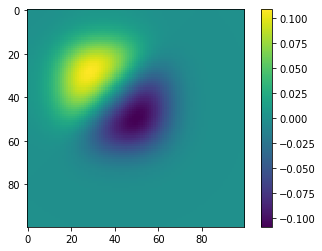

In [39]:
plt.imshow(x_comp_sim[28]+y_comp_sim[28])
plt.colorbar()

In [40]:
from IPython.display import HTML
HTML(ani_sim.to_jshtml())

.........................................

# Conclustion

Dense optical flow is different from motion detection which becomes visible here. Some patterns in dense optical flow (e.g. saddles) arguably relate to a local peak in activation that occurs at a specific location. If one applies dense optical flow on the neural signals with peaks that do not move but increase/decrease in intensity this is what one will arguably capture when transforming the signal using e.g. Horn and Schuncks method and detecting motion patterns.